In [1]:
import pandas as pd
import numpy as np
import os
import datetime
from scipy import stats
import missingno as msno

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
import seaborn as sns

import shapefile as shp

from sklearn.linear_model import ElasticNet, LassoLarsCV, RidgeCV, ElasticNetCV

from sklearn.manifold import TSNE

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import GridSearchCV
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared

from sklearn import cluster, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import silhouette_score

import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable

from bokeh.plotting import figure
from bokeh.io import show, output_notebook, output_file
from bokeh.models import CategoricalColorMapper, HoverTool, ColumnDataSource, Panel
from bokeh.palettes import d3
from bokeh.models.widgets import CheckboxGroup, Slider, RangeSlider, Tabs
from bokeh.layouts import column, row, WidgetBox
from bokeh.application.handlers import FunctionHandler
from bokeh.application import Application

output_notebook()

Loading BokehJS ...

In [4]:
months = np.array(['january','february','march','april','may','june','july','august','september','october','november','december'])

In [5]:
shp_path = 'data/distritos_pt/distritos.shp'
sf = shp.Reader(shp_path)
gdf = gpd.read_file(shp_path)

gdf = gdf[gdf['TYPE_1'] == 'Distrito'].reset_index(drop=True)
gdf.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,HASC_1,CCN_1,CCA_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry
0,182,PRT,Portugal,1,Évora,PT.EV,0,07,Distrito,District,None,None,"POLYGON ((-8.14205 39.01529, -8.14165 39.01466..."
1,182,PRT,Portugal,2,Aveiro,PT.AV,0,01,Distrito,District,None,None,"MULTIPOLYGON (((-8.68208 40.69458, -8.68208 40..."
2,182,PRT,Portugal,4,Beja,PT.BE,0,02,Distrito,District,None,None,"MULTIPOLYGON (((-8.79264 37.71875, -8.79264 37..."
3,182,PRT,Portugal,5,Braga,PT.BR,0,03,Distrito,District,None,None,"POLYGON ((-8.04962 41.81636, -8.04908 41.81543..."
4,182,PRT,Portugal,6,Bragança,PT.BA,0,04,Distrito,District,None,Braganza,"POLYGON ((-6.79995 41.98915, -6.79787 41.98859..."


In [19]:
filepath = 'data/standvirtual_cars_clean_merge_200411.csv'
df = pd.read_csv(filepath)

df['reg_month'] = [np.where(months == x)[0][0] if isinstance(x, str) else np.nan for x in df['reg_month']]
df['advertiser'] = [1 if x == 'individial' else 0 if x == 'professional' else np.nan for x in df['advertiser']]
df['traction'] = [0 if x == 'back' else 1 if x == 'front' else 2 if x == 'both' else np.nan for x in df['traction']]
df['upholstery'] = [0 if x == 'fabric' else 1 if x == 'leather' else np.nan for x in df['upholstery']]
df['air_conditioning'] = [0 if x == 'independent' else 1 if x == 'manual' else 2 if x == 'automatic' else np.nan for x in df['air_conditioning']]
df['vehicle_condition'] = [0 if x == 'used' else 1 if x == 'new' else np.nan for x in df['vehicle_condition']]
df['gear_type'] = [0 if x == 'manual' else 1 if x == 'semiauto' else 2 if x == 'automatic' else np.nan for x in df['gear_type']]

df = df.drop(columns=['title','link'])
df.head()

,fuel_type,mileage,power,origin,city,region,reg_month,reg_year,garanty,price_neg,...,vat_deductable,price_without_iuc,canopy,max_range,saved,classic,price_without_isv,stand_guaranty_not_in_price,factory_guaranty_until_date,vat_discriminated
0,diesel,32448.0,194.0,NaN,Marinha Grande,Leiria,4.0,2018.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,diesel,168000.0,105.0,NaN,Alvalade,Lisboa,7.0,2008.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,gasoline,49300.0,370.0,Nacional,Cascais e Estoril,Lisboa,3.0,2016.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,hybrid_gasoline,58900.0,365.0,NaN,"Sintra (Santa Maria e São Miguel, São Martinho...",Lisboa,1.0,2016.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,diesel,142000.0,143.0,NaN,Sacavém e Prior Velho,Lisboa,6.0,2009.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


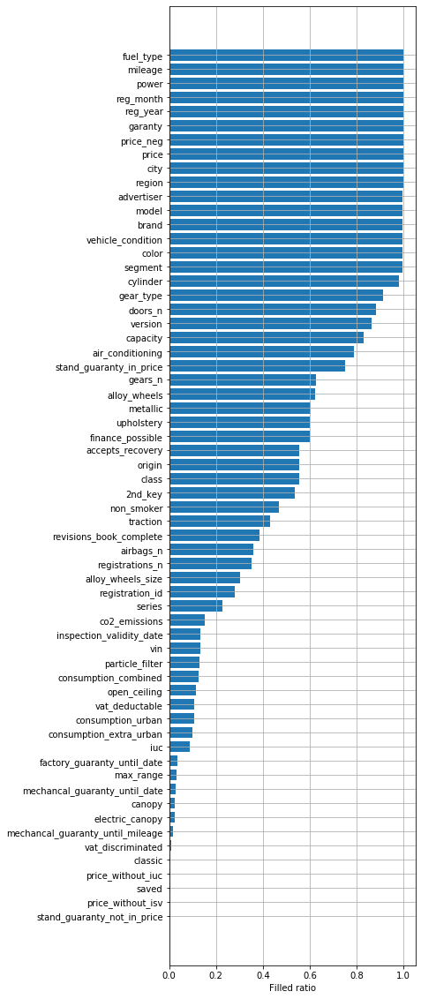

In [20]:
fill_ratio = 1-df.isna().sum(axis=0)/len(df)
six = np.argsort(fill_ratio)

fig, ax = plt.subplots(1, figsize=[5,20])
plt.barh(df.columns[six],fill_ratio[six])
plt.grid()
plt.xlabel('Filled ratio')
plt.show()

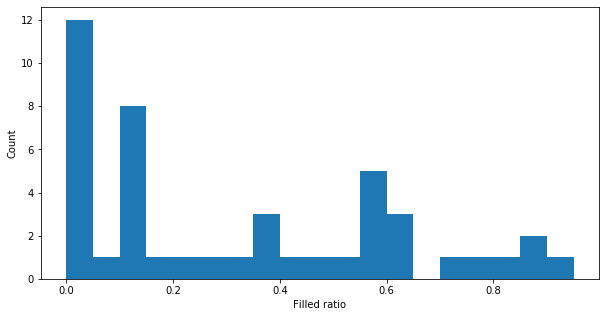

In [21]:
fig, ax = plt.subplots(1, figsize=[10,5])
plt.hist(fill_ratio, bins=np.arange(0,1,0.05))
plt.xlabel('Filled ratio')
plt.ylabel('Count')
plt.show()

## Plot region price averages

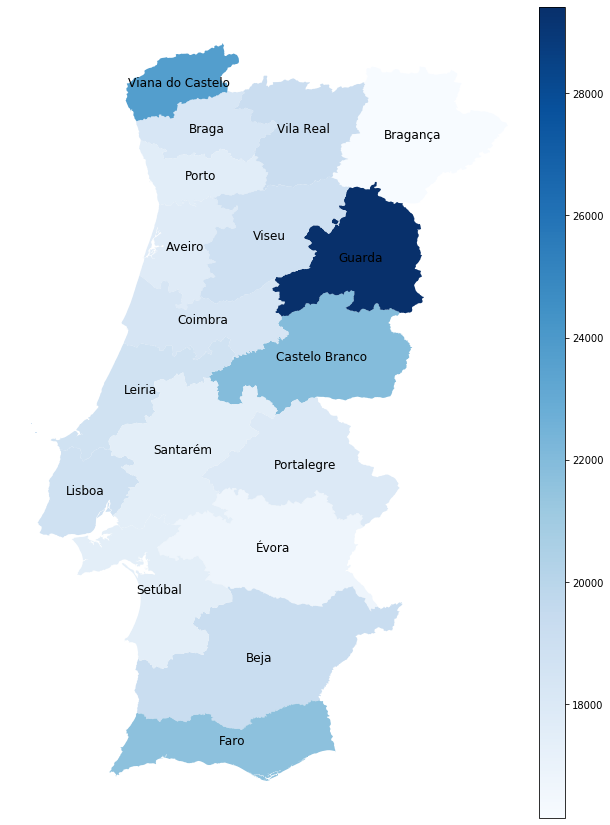

In [22]:
merged = gdf.merge(df.groupby('region').mean(), left_on = 'NAME_1', right_on = 'region')

cx = merged.centroid.x.values
cy = merged.centroid.y.values

fig, ax = plt.subplots(figsize=[10,20])
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged.plot(column='price', ax=ax, legend=True, cmap='Blues', cax=cax)
for i in range(len(merged)):
    ax.text(cx[i],cy[i],merged.at[i,'NAME_1'], ha='center', va='center', fontsize=12)
ax.axis('off')
plt.show()

## Modelling

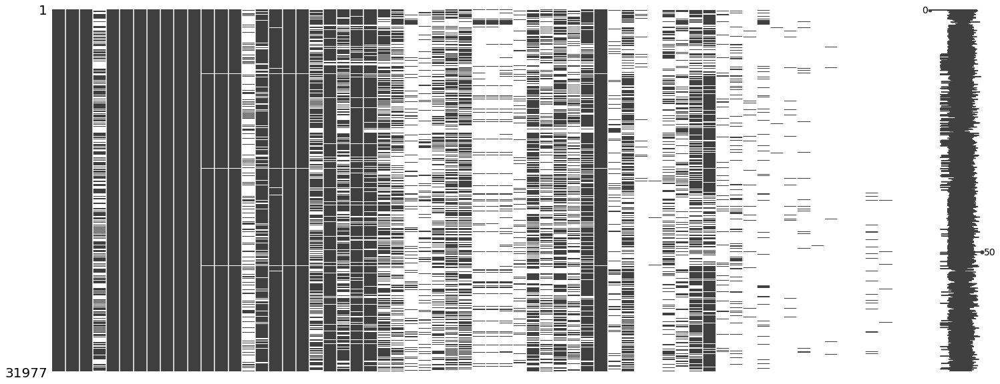

In [24]:
msno.matrix(df);

### Prepare data

In [25]:
cols2use = [
    'fuel_type',
    'mileage',
    'power',
    'region',
    'reg_year',
    'garanty',
    'price_neg',
    'price',
    'advertiser',
    'brand',
    'model',
    'cylinder',
    'segment',
    'color',
    'metallic',
    'gear_type',
    'gears_n',
    'doors_n',
    'capacity',
    'air_conditioning',
    'vehicle_condition',
]

#fill_ratio_thr = 0.7
#cols2use = df.columns[fill_ratio >= fill_ratio_thr]

dfX = df[cols2use]

for column in dfX.columns:
 if dfX[column].dtype==object:
    dummyCols = pd.get_dummies(dfX[column])
    dummyCols.columns = column+'_'+dummyCols.columns.values
    dfX = dfX.join(dummyCols)
    del dfX[column]
    
dfX = dfX.loc[~dfX.isna().any(axis=1)].reset_index(drop=True)

In [26]:
np.shape(dfX)

(11922, 1142)

In [27]:
X = dfX.drop(columns='price').values
Y = dfX['price'].values

## Ridge

In [31]:
clf_rdg = RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1], cv=5).fit(X, Y)
clf_rdg_score = clf_rdg.score(X, Y)
print('R2 = %0.2f'%(clf_rdg_score))

R2 = 0.91


## Lasso

In [32]:
clf_lss = LassoLarsCV(cv=5, eps=1).fit(X, Y)
clf_lss_score = clf_lss.score(X,Y)

print('R2 = %0.2f'%(clf_lss_score))

R2 = 0.91


## T-SNE

In [29]:
tsne_perp = 50
tsne_dim = 2

X_tsne = TSNE(n_components=tsne_dim, n_jobs=-1, perplexity=tsne_perp).fit_transform(X)


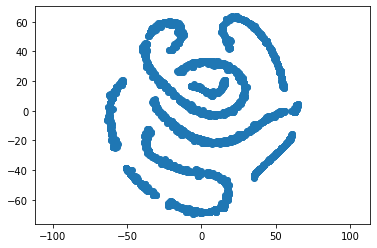

In [30]:
fig, ax = plt.subplots()
plt.scatter(X_tsne[:,0],X_tsne[:,1])
plt.axis('equal')
plt.show()

## Difference beteen actual and predicted price

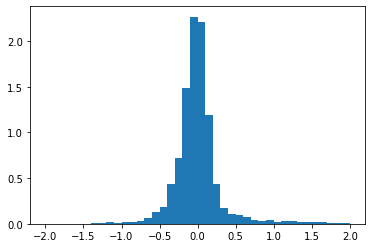

In [35]:
md = Y-clf_rdg.predict(X)
md_r = md/Y
plt.hist(md_r, bins=np.arange(-2,2.1,0.1), density=True)
plt.show()

## How does price difference change with price percentiles?

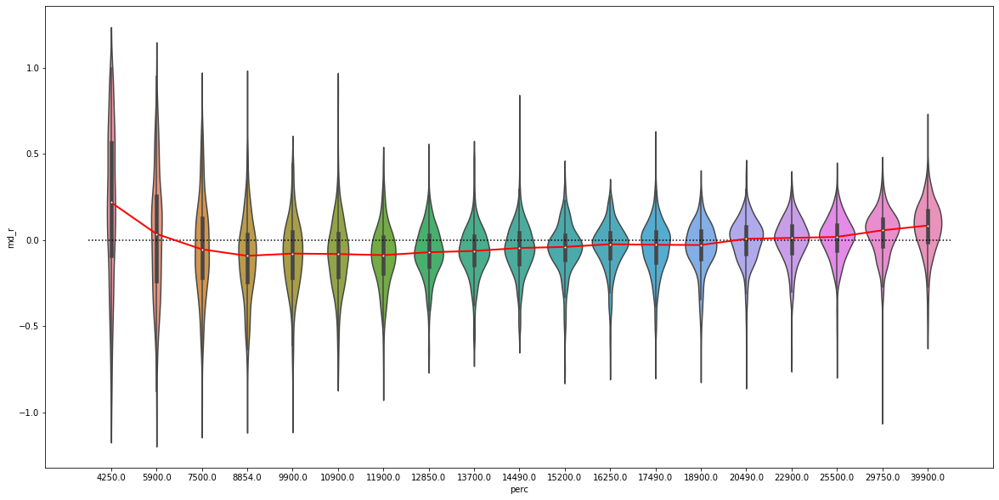

In [36]:
percs_x = np.arange(5,100,5)
percs_y = np.percentile(Y,percs_x)

percs_ix = [np.where(x >= percs_y)[0][-1] if x > percs_y[0] else 0 for x in Y]

dfP = pd.DataFrame(np.array([Y,md,md_r,percs_ix]).T, columns=['price','md','md_r','perc'])
dfP = dfP[(dfP['md_r'] >= -1) & (dfP['md_r'] <= 1)]
dfX2 = pd.concat([dfX,dfP], axis=1)

fig, ax = plt.subplots(figsize=[20,10])
sns.violinplot(x='perc', y='md_r', data=dfX2, ax=ax)
ax.set_xticklabels(np.round(percs_y))
l, r = ax.get_xlim()
plt.plot([l,r],[0,0],'k:')
plt.plot(dfX2.groupby('perc').median()['md_r'].values, 'r', linewidth=2)
plt.show()

In [282]:
price_lims = [0, 60000]
bin_w = 1000

def modify_doc(doc):
    def make_dataset(df, col2use, labs2use=[]):
        
        df0 = pd.DataFrame(columns=['proportion', 'left', 'right', 'f_proportion', 'f_interval', 'name', 'color'])
        
        if not any(labs2use):
            values = df[col2use].unique()
        else:
            values = list(labs2use)
        colors = d3['Category20'][20]+d3['Category20b'][20]+d3['Category20c'][20]
        if len(values) > 60:
            colors = colors*int(np.ceil(len(values)/60))
        

        # Iterate through all the carriers
        for i, val in enumerate(values):

            # Subset to the carrier
            subset = df[df[col2use] == val]

            # Create a histogram with specified bins and range
            arr_hist, edges = np.histogram(subset['price'], bins=int(price_lims[1]/bin_w), range=price_lims)

            # Divide the counts by the total to get a proportion and create df
            arr_df = pd.DataFrame({'proportion': arr_hist / np.sum(arr_hist), 
                                'left': edges[:-1], 'right': edges[1:] })

            # Format the proportion 
            arr_df['f_proportion'] = ['%0.5f' % proportion for proportion in arr_df['proportion']]

            # Format the interval
            arr_df['f_interval'] = ['%d to %d euros' % (left, right) for left, 
                                    right in zip(arr_df['left'], arr_df['right'])]

            # Assign the name
            arr_df['name'] = val

            # Color each value
            
            arr_df['color'] = colors[i]

            # Add to the overall dataframe
            df0 = df0.append(arr_df, ignore_index=True)

        # Overall dataframe
        df0 = df0.sort_values(['name', 'left']).reset_index(drop=True)
        
        # Convert dataframe to column data source
        return ColumnDataSource(df0)


    def make_plot(src):
        # Blank plot with correct labels
        p = figure(plot_width = 700, plot_height = 700, 
                    title = 'Car price histogram',
                    x_axis_label = 'Price', y_axis_label = 'Proportion')

        # Quad glyphs to create a histogram
        p.quad(source = src, bottom = 0, top = 'proportion', left = 'left', right = 'right',
                color = 'color', fill_alpha = 0.5, hover_fill_color = 'color', legend_field = 'name',
                hover_fill_alpha = 1.0, line_color = 'black')

        # Hover tool with vline mode
        hover = HoverTool(tooltips=[('Value', '@name'), 
                                    ('Range', '@f_interval'),
                                    ('Proportion', '@f_proportion')],
                                    mode='vline')

        p.add_tools(hover)
        p.hover.point_policy = "follow_mouse"

        return p


        def update(attr, old, new):
            labs2use = [selection.labels[i] for i in selection.active]
            
            new_src = make_dataset(df, col2use, labs2use)

            src.data.update(new_src.data)

        labs = df[col2use].unique()
        selection = CheckboxGroup(labels=labs, active = [0, 1])            
        selection.on_change('active', update)
        
        controls = WidgetBox(selection)
        
        initial_labs = [selection.labels[i] for i in selection.active]
        
        src = make_dataset(df, col2use, initial_labs)
        
        p = make_plot(src)
        
        layout = row(controls, p)
        doc.add_root(layout)
        
# Set up an application
handler = FunctionHandler(modify_doc)
app = Application(handler)

In [283]:
show(app)